<a href="https://colab.research.google.com/github/pxs1990/Apriori_algorithm/blob/main/Complete_Classification_Algorithm_BankChurnData_1hotE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [115]:

path='/content/BankChurners.csv'
df=pd.read_csv(path)
df.head(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45.0,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49.0,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51.0,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40.0,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40.0,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
5,713061558,Existing Customer,44.0,M,2,Graduate,Married,$40K - $60K,Blue,36,...,1,2,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311
6,810347208,Existing Customer,51.0,M,4,Unknown,Married,$120K +,Gold,46,...,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066
7,818906208,Existing Customer,32.0,M,0,High School,Unknown,$60K - $80K,Silver,27,...,2,2,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048
8,710930508,Existing Customer,NaN,M,3,Uneducated,Single,$60K - $80K,Blue,36,...,2,0,22352.0,2517,19835.0,3.355,1350,24,1.182,0.113
9,719661558,Existing Customer,48.0,M,2,Graduate,Single,$80K - $120K,Blue,36,...,3,3,11656.0,1677,9979.0,1.524,1441,32,0.882,0.144


In [ ]:
df.shape# df has 10127 rows and 23 columns

(10127, 21)

In [116]:
data=df.copy()

In [ ]:
data.isnull().sum() # printing the null values in each col

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                5
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
data.isnull().count()# gives total no of records in each col including null value counts.

CLIENTNUM                   10127
Attrition_Flag              10127
Customer_Age                10127
Gender                      10127
Dependent_count             10127
Education_Level             10127
Marital_Status              10127
Income_Category             10127
Card_Category               10127
Months_on_book              10127
Total_Relationship_Count    10127
Months_Inactive_12_mon      10127
Contacts_Count_12_mon       10127
Credit_Limit                10127
Total_Revolving_Bal         10127
Avg_Open_To_Buy             10127
Total_Amt_Chng_Q4_Q1        10127
Total_Trans_Amt             10127
Total_Trans_Ct              10127
Total_Ct_Chng_Q4_Q1         10127
Avg_Utilization_Ratio       10127
dtype: int64

In [ ]:
len(df['Gender'])

10127

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10122 non-null  float64
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [ ]:
data.duplicated().value_counts()

False    10127
dtype: int64

In [ ]:
duplicate_rows = data[data.duplicated(subset=['CLIENTNUM', 'Gender', 'Education_Level'],keep=False)]
duplicate_rows.count()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
# let's check for missing values percent in the data
round(data.isnull().sum() / data.isnull().count() * 100, 2)

CLIENTNUM                   0.00
Attrition_Flag              0.00
Customer_Age                0.05
Gender                      0.00
Dependent_count             0.00
Education_Level             0.00
Marital_Status              0.00
Income_Category             0.00
Card_Category               0.00
Months_on_book              0.00
Total_Relationship_Count    0.00
Months_Inactive_12_mon      0.00
Contacts_Count_12_mon       0.00
Credit_Limit                0.00
Total_Revolving_Bal         0.00
Avg_Open_To_Buy             0.00
Total_Amt_Chng_Q4_Q1        0.00
Total_Trans_Amt             0.00
Total_Trans_Ct              0.00
Total_Ct_Chng_Q4_Q1         0.00
Avg_Utilization_Ratio       0.00
dtype: float64

In [ ]:
data.nunique()

CLIENTNUM                   10127
Attrition_Flag                  2
Customer_Age                   45
Gender                          2
Dependent_count                 6
Education_Level                 7
Marital_Status                  4
Income_Category                 6
Card_Category                   4
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64

In [ ]:
data.Gender.unique()

array(['M', 'F'], dtype=object)

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,7.391776e+08,3.690378e+07,708082083.0,7.130368e+08,7.179264e+08,7.731435e+08,8.283431e+08
Customer_Age,10122.0,4.632464e+01,8.016195e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,10127.0,2.346203e+00,1.298908e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,10127.0,3.592841e+01,7.986416e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,10127.0,3.812580e+00,1.554408e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,10127.0,2.341167e+00,1.010622e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,10127.0,2.455317e+00,1.106225e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,10127.0,8.631954e+03,9.088777e+03,1438.3,2.555000e+03,4.549000e+03,1.106750e+04,3.451600e+04
Total_Revolving_Bal,10127.0,1.162814e+03,8.149873e+02,0.0,3.590000e+02,1.276000e+03,1.784000e+03,2.517000e+03
Avg_Open_To_Buy,10127.0,7.469140e+03,9.090685e+03,3.0,1.324500e+03,3.474000e+03,9.859000e+03,3.451600e+04


In [ ]:
# let's view the statistical summary of the non-numerical columns in the data
data.describe(exclude=np.number).T


,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Education_Level,10127,7,Graduate,3128
Marital_Status,10127,4,Married,4687
Income_Category,10127,6,Less than $40K,3561
Card_Category,10127,4,Blue,9436


In [ ]:
data['Income_Category'].unique()

array(['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K',
       '$120K +', 'Unknown'], dtype=object)

In [ ]:
data['Card_Category'].unique()

array(['Blue', 'Gold', 'Silver', 'Platinum'], dtype=object)

In [ ]:
pd.crosstab(data['Income_Category'],data['Card_Category'])

Card_Category,Blue,Gold,Platinum,Silver
Income_Category,,,,
$120K +,645,18,4,60
$40K - $60K,1675,15,1,99
$60K - $80K,1273,29,4,96
$80K - $120K,1395,21,2,117
Less than $40K,3403,24,4,130
Unknown,1045,9,5,53


In [ ]:
cat_col = data.select_dtypes("object")
cat_col.head()

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
0,Existing Customer,M,High School,Married,$60K - $80K,Blue
1,Existing Customer,F,Graduate,Single,Less than $40K,Blue
2,Existing Customer,M,Graduate,Married,$80K - $120K,Blue
3,Existing Customer,F,High School,Unknown,Less than $40K,Blue
4,Existing Customer,M,Uneducated,Married,$60K - $80K,Blue


In [ ]:
pd.pivot_table(data, index='Income_Category', columns='Gender', aggfunc='mean',values='Credit_Limit', fill_value=data['Credit_Limit'].mean())

Gender,F,M
Income_Category,,
$120K +,8631.953698,19717.322558
$40K - $60K,4813.705227,6309.726804
$60K - $80K,8631.953698,10758.772967
$80K - $120K,8631.953698,15809.890945
Less than $40K,3684.819945,4579.371119
Unknown,9373.363585,12436.044231


# **Data Cleaning**

In [ ]:
#drop client_id as it is unique and doesnt add value to the model.
data.drop(columns=["CLIENTNUM"], inplace=True)# inplace makes the change permanent in original df


In [ ]:
data.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45.0,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49.0,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51.0,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40.0,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40.0,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


# **check the count of each unique category in each of the categorical variables.**

In [ ]:
# Making a list of all catrgorical variables
cat_col = data.select_dtypes("object").columns.to_list()
cat_col


['Attrition_Flag',
 'Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category']

In [ ]:
# Printing number of count of each unique value in each column
for i in cat_col:
    print(data[i].value_counts())
    print("-" * 40)#printing 40 --- lines after each iteration.

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64
----------------------------------------
F    5358
M    4769
Name: Gender, dtype: int64
----------------------------------------
Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
----------------------------------------
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: Marital_Status, dtype: int64
----------------------------------------
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64
----------------------------------------
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64
----------------------------------------


In [ ]:
# Get the normalized value counts for Attrition_Flag
df["Attrition_Flag"].value_counts(normalize=True)

Existing Customer    0.83934
Attrited Customer    0.16066
Name: Attrition_Flag, dtype: float64

We have more female customers as compared to male customers.
There are very few observations of Platinum Card holders (20).
We can see that the distribution of classes in the target variable is imbalanced i.e. only ~16% observations with existing customers (non-attritees).
Replace incorrect data entry values with an imputed mode. *italicized text*

In [ ]:
# subset to view incorrect values
data[data.Income_Category == "Unknown"]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
19,Existing Customer,45.0,F,2,Graduate,Married,Unknown,Blue,37,6,1,2,14470.0,1157,13313.0,0.966,1207,21,0.909,0.080
28,Existing Customer,NaN,F,3,Uneducated,Single,Unknown,Blue,34,5,2,2,10100.0,0,10100.0,0.525,1052,18,1.571,0.000
39,Attrited Customer,66.0,F,0,Doctorate,Married,Unknown,Blue,56,5,4,3,7882.0,605,7277.0,1.052,704,16,0.143,0.077
44,Existing Customer,38.0,F,4,Graduate,Single,Unknown,Blue,28,2,3,3,9830.0,2055,7775.0,0.977,1042,23,0.917,0.209
58,Existing Customer,44.0,F,5,Graduate,Married,Unknown,Blue,35,4,1,2,6273.0,978,5295.0,2.275,1359,25,1.083,0.156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10021,Attrited Customer,30.0,F,1,Graduate,Married,Unknown,Blue,18,4,1,4,4377.0,2517,1860.0,0.941,8759,74,0.609,0.575
10040,Attrited Customer,50.0,F,3,Doctorate,Single,Unknown,Blue,36,4,3,3,5173.0,0,5173.0,0.912,8757,68,0.789,0.000
10083,Existing Customer,42.0,F,4,Uneducated,Married,Unknown,Blue,23,4,1,2,8348.0,0,8348.0,0.695,15905,111,0.708,0.000
10092,Attrited Customer,40.0,F,3,Graduate,Married,Unknown,Blue,25,1,2,3,6888.0,1878,5010.0,1.059,9038,64,0.829,0.273


In [ ]:
# replace missing values(unknown) with nan
data.Income_Category.replace("Unknown", np.nan, inplace=True)


In [ ]:
# check if anymore unknown
data[data.Income_Category == "Unknown"]#"Unknown" in data['Income_Category']

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio


In [ ]:
# check value replacement
data.Income_Category.value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
$120K +            727
Name: Income_Category, dtype: int64

In [ ]:
#data = data[data['Income_Category'] != 3561]# by mistake I got the category 3561, lets drop.

In [ ]:
# imputing nan by most frequent values
data.Income_Category = data.Income_Category.fillna(value=data["Income_Category"].value_counts().index[0])
data.Income_Category.value_counts()

Less than $40K    4673
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
$120K +            727
Name: Income_Category, dtype: int64

In [ ]:
data.Income_Category.isnull().sum()

0

In [ ]:
# filling unknown values in Education_level col
data.Education_Level.replace("Unknown", np.nan, inplace=True)
data.Education_Level.value_counts()

Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

In [ ]:
data.Education_Level.isnull().sum()

1519

In [ ]:
#imputing null educationlevel by high-school value
data.Education_Level = data.Education_Level.fillna(value=data["Education_Level"].value_counts().index[1])
data.Education_Level.value_counts()

# constant_value = data['Marital_Status'].value_counts().index[1]
# # Create a SimpleImputer instance with a custom imputation function
# imputer = SimpleImputer(strategy='constant', fill_value=constant_value)

High School      3532
Graduate         3128
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

In [ ]:
#Imputing marital_status
data.Marital_Status.replace("Unknown", np.nan, inplace=True)
data.Marital_Status.value_counts()


Married     4687
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64

In [ ]:
data.Marital_Status = data.Marital_Status.fillna(value=data.Marital_Status.value_counts().index[0])
data.Marital_Status.value_counts()

Married     5436
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64

In [ ]:
#Imputing Age
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
data['Customer_Age']= imputer.fit_transform(data['Customer_Age'].values.reshape(-1,1))
data.Customer_Age.isnull().sum()

0

In [ ]:
# Merging Gold and Platinum category in Premium category
data['Card_Category'].replace({'Gold': 'Premium', 'Platinum': 'Premium'}, inplace=True)
data['Card_Category'].value_counts()

Blue       9436
Silver      555
Premium     136
Name: Card_Category, dtype: int64

# **Visualization**

**Univariate**

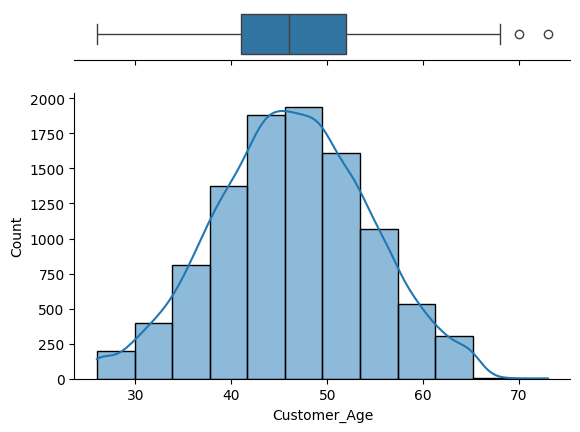

In [ ]:
import seaborn as sns
x = data['Customer_Age']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

The distribution of age is normal.
The boxplot shows that there are outliers at the right end.We will not treat these outliers as they represent the real market trend

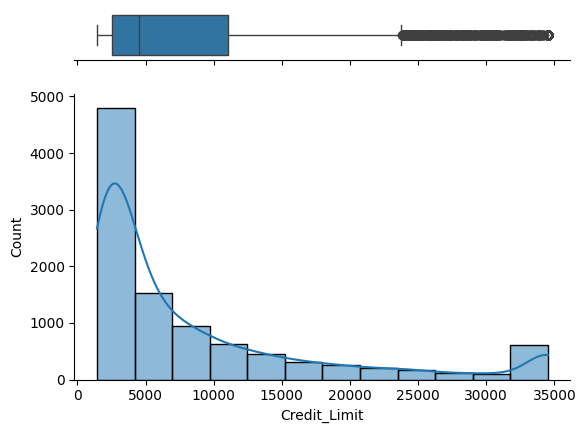

In [ ]:
import seaborn as sns
x = data['Credit_Limit']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

The distribution of the credit amount is right-skewed
The boxplot shows that there are outliers at the right end. We will not treat these outliers as they represent the real market trend

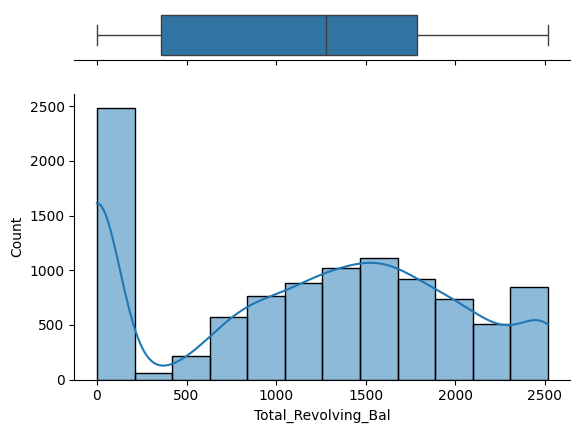

In [ ]:
import seaborn as sns
x = data['Total_Revolving_Bal']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

The distribution of the balance that carries over from one month to the next is the revolving balance for which the credit is given is somewhat normal.

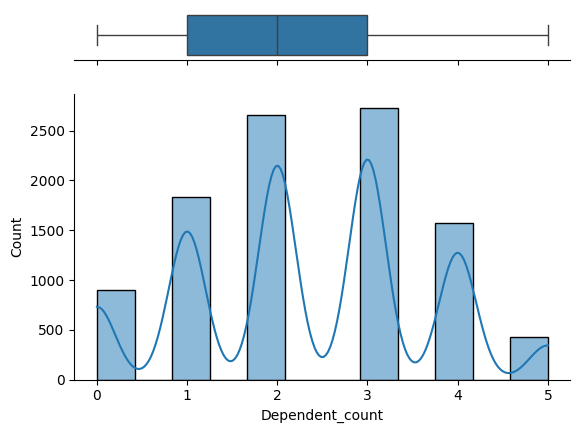

In [ ]:
import seaborn as sns
x = data['Dependent_count']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

Majority of card holders have 2 or 3 dependents.

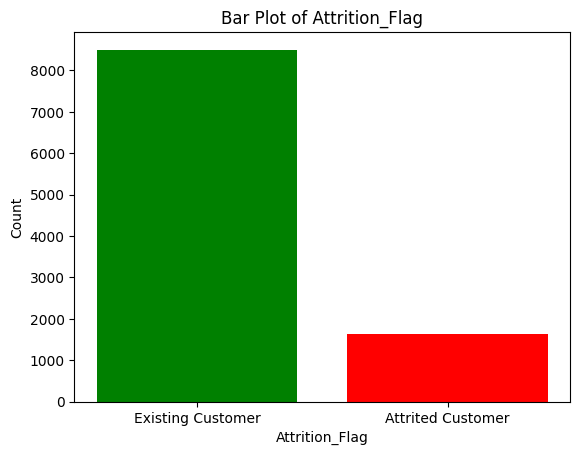

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

Attrition_Flag_counts = data['Attrition_Flag'].value_counts()

plt.bar(Attrition_Flag_counts.index, Attrition_Flag_counts, color=['green', 'red'])

# Add labels and title
plt.xlabel('Attrition_Flag')
plt.ylabel('Count')
plt.title('Bar Plot of Attrition_Flag')

plt.show()


This shows that the data is highly imbalanced. So, we will do SMOTE-Synthetic Minority Over-sampling Technique. OR, undersampling techiques = Random Under Sampler (rus), NearMiss, Edited Nearest Neighbors (ENN

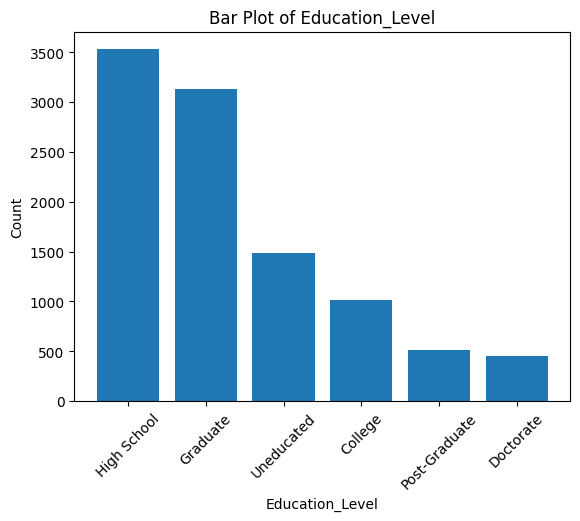

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

Education_Level_counts = data['Education_Level'].value_counts()

plt.bar(Education_Level_counts.index, Education_Level_counts)

# Add labels and title
plt.xlabel('Education_Level')
plt.ylabel('Count')
plt.title('Bar Plot of Education_Level')

plt.xticks(rotation=45)

plt.show()

This shows that the data is highly imbalaned which can make our model unaccurate. We will use SMOTE to handle this.

**Bivariate**

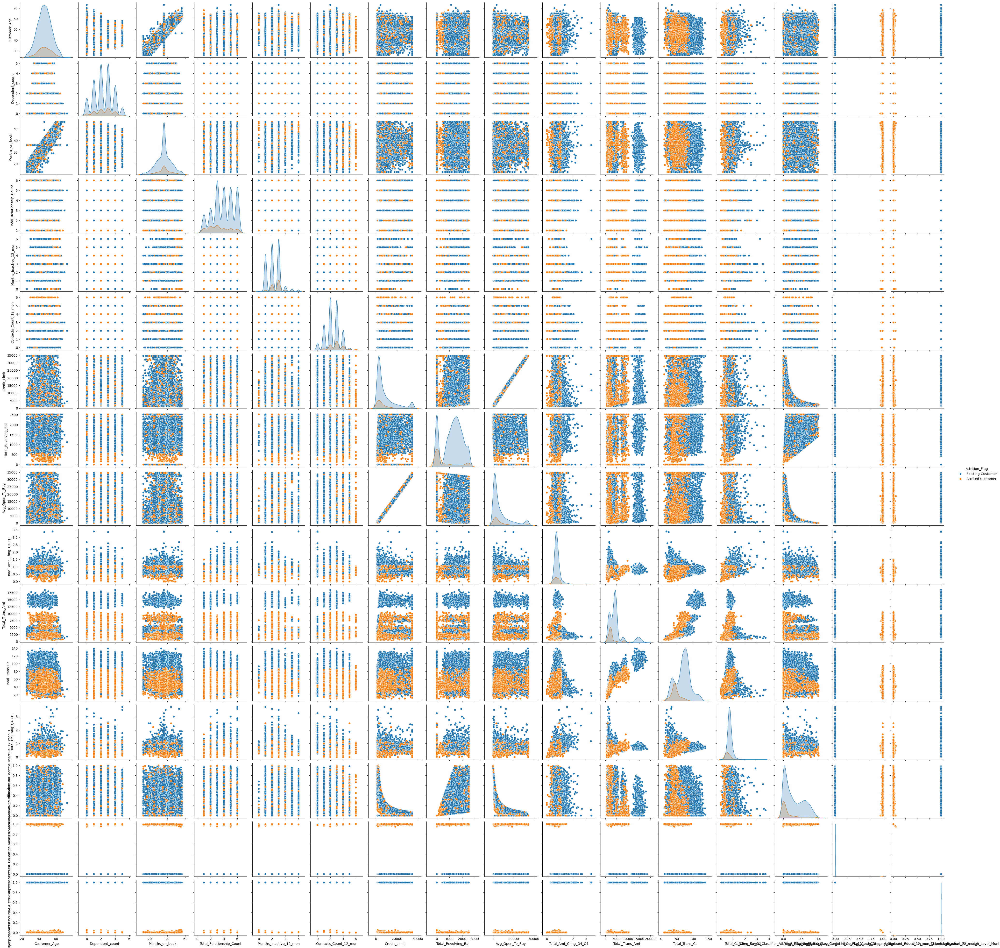

In [ ]:
# seaborn pairplot
sns.pairplot(data, hue="Attrition_Flag")


**Let's explore this further with the help of other plots.**

<Axes: xlabel='Attrition_Flag', ylabel='Customer_Age'>

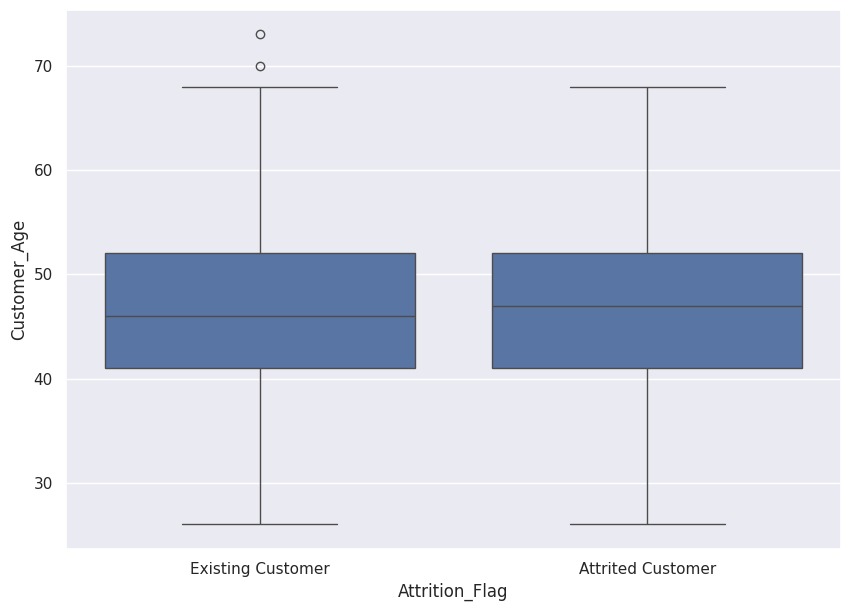

In [ ]:
# box plots on 2 variables
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Customer_Age", data=data, orient="vertical")

We can see that the median age of attritees is higher than the median age of non-attritees.
This shows that younger customers are more likely to stay as customers.
There are outliers in boxplots of only existing customers.

In [ ]:
import seaborn as sns
data.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45.0,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49.0,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51.0,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40.0,F,4,High School,Married,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40.0,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


<Axes: xlabel='Customer_Age', ylabel='Proportion'>

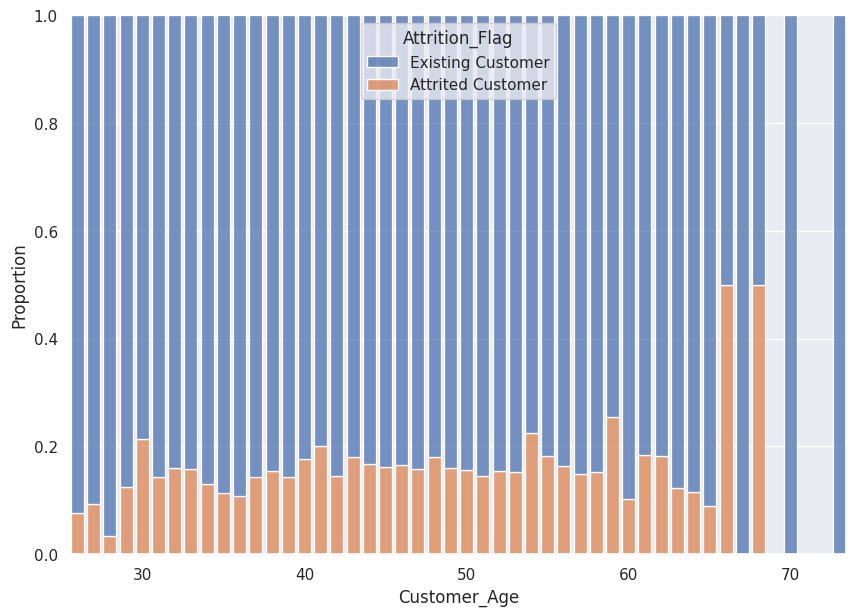

In [ ]:
sns.histplot(
    data=data,
    x='Customer_Age', hue="Attrition_Flag",
    multiple="fill", stat="proportion",
    discrete=True, shrink=.8)

We see how older customers(70+) tend to be existing customers while Younger people might look to attrite for new and better credit options.

40-year-olds take up the majority of the dataset.

43 - 48 year olds tended to attrite.

<Axes: xlabel='Card_Category', ylabel='Proportion'>

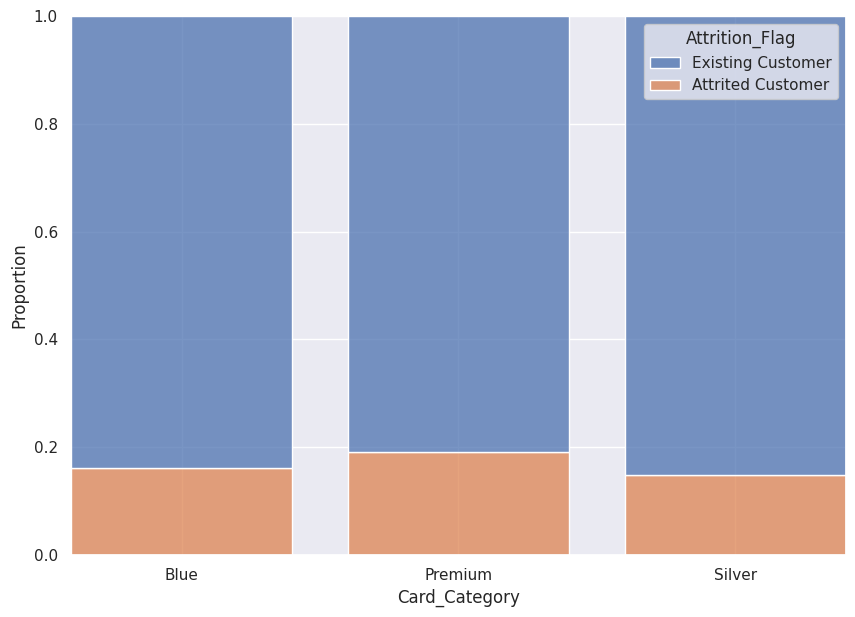

In [ ]:
sns.histplot(data=data,
    x='Card_Category', hue="Attrition_Flag",# hue gives diff proportions
    multiple="fill", stat="proportion",# stat is proportion not count.
    shrink=.8)#shrink avoids overlap

Customers owning a Silver or Blue card are less likely to attrit
Customers with Platinum or Gold cards are more likley to attrit.


<ipython-input-53-4106b8aba0c6>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")


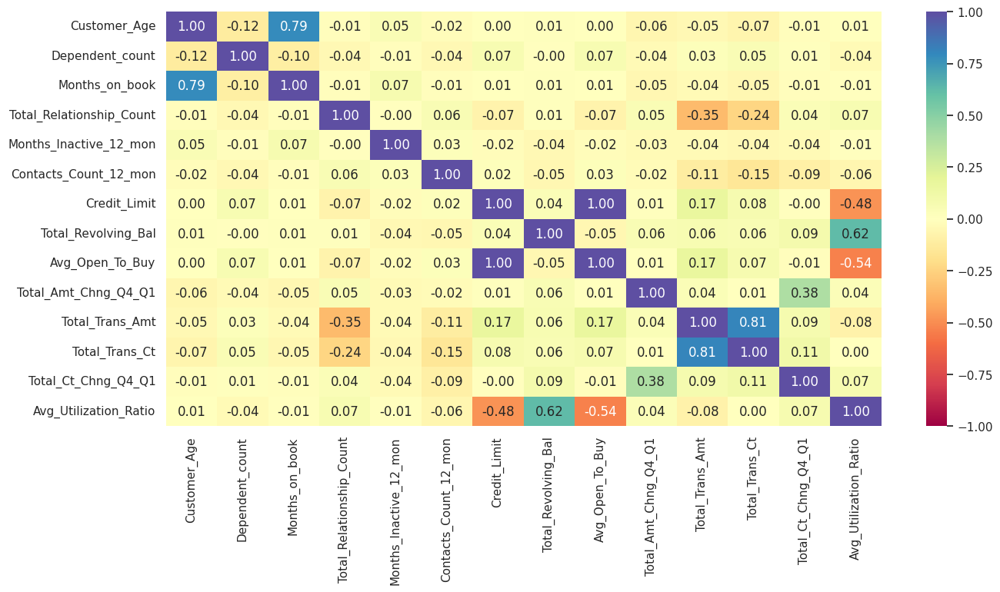

In [ ]:
# plot hitmap correlation matrix
plt.figure(figsize=(15, 7))
sns.heatmap(data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

Total_Trans_Ct is highly correlated with Total_Trans_Amt which makes sense since both are related to the transactions of the credit card holder.
Months_on_book is related to Customer_Age which makes some sense since older customers would have more time on the banks books.
Avg_Utilization_Ratio has a correlation with Total_Revolving_Bal which makes sense since both are related to blaance.
Other variables have no significant correlation between them

## **Data preprocessing for Modeling**

In [165]:
# Separating dep and indep variable
X = data.drop(columns="Attrition_Flag")
y = data["Attrition_Flag"]
X.head()

,CLIENTNUM,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,45.0,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,49.0,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,51.0,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,40.0,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,40.0,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [118]:
y

0        Existing Customer
1        Existing Customer
2        Existing Customer
3        Existing Customer
4        Existing Customer
               ...        
10122    Existing Customer
10123    Attrited Customer
10124    Attrited Customer
10125    Attrited Customer
10126    Attrited Customer
Name: Attrition_Flag, Length: 10127, dtype: object

# **Splitting data into training, validation and test set:**

In [166]:
# first we split data into 2 parts, say temporary and test
from sklearn.model_selection import train_test_split
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.20, random_state=0, stratify=y)

# then we split the temporary set into train and validation
X_train1, X_val, y_train1, y_val = train_test_split(X_temp, y_temp,test_size=0.25,random_state=1, stratify=y_temp)  # set the weighting feature on

print(X_train1.shape, X_val.shape, X_test.shape)

# By using stratify=y, you're telling train_test_split to split the data while keeping the same distribution of classes in both
# the training and testing datasets as it is in the original dataset. This can be beneficial, especially when dealing with
# classification tasks to ensure that the model sees a representative sample of all classes during both training and testing phases.


(6075, 20) (2026, 20) (2026, 20)


# **OneHotEncoding Categorical and Feature Scaling numeric data**

In [146]:
#Encoding categorical col and feature scaling numeric cols
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
# Create transformers
feature_scaler = StandardScaler()
oneHot_encoder = OneHotEncoder()

# Create a ColumnTransformer
col_transformer = ColumnTransformer(
    transformers=[
        ('featureScaling', feature_scaler, X_train1.select_dtypes(include=['number']).columns),
        ('OneHotEncoding', oneHot_encoder, X_train1.select_dtypes(exclude=['number']).columns)
    ])

# Apply the ColumnTransformer to the DataFrame
X_train = col_transformer.fit_transform(X_train1)
X_test=col_transformer.transform(X_test)


In [147]:
X_train

array([[-0.55219857, -0.15288836,  1.28039891, ...,  0.        ,
         0.        ,  0.        ],
       [-0.66693823,  1.33234778,  0.51231129, ...,  0.        ,
         0.        ,  0.        ],
       [-0.80228696, -0.15288836, -0.25577634, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.7625956 , -0.27665804,  1.28039891, ...,  0.        ,
         0.        ,  0.        ],
       [-0.58136608, -1.01927611, -1.02386397, ...,  0.        ,
         0.        ,  0.        ],
       [-0.75026234, -1.01927611, -0.25577634, ...,  0.        ,
         0.        ,  0.        ]])

In [148]:
# encoding Attrition_Flag attribute
from sklearn.preprocessing import LabelEncoder
encoder=LabelEncoder()
y_train=encoder.fit_transform(y_train1)
y_test=encoder.transform(y_test)
y_train

# y_df['Attrition_Flag'] = y_df['Attrition_Flag'].map({'Existing Customer':1, 'Attrited Customer':0})
# y_df['Attrition_Flag']

array([1, 1, 1, ..., 1, 1, 1])

In [149]:
X_train1

,CLIENTNUM,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
4587,718622658,45.0,M,4,High School,Single,$80K - $120K,Blue,34,3,2,3,15913.0,1696,14217.0,0.632,4472,86,0.792,0.107
6199,714396558,57.0,F,3,High School,Married,Less than $40K,Blue,51,6,2,3,1511.0,0,1511.0,0.678,4683,87,0.706,0.000
6940,709411383,45.0,M,2,Uneducated,Unknown,$40K - $60K,Blue,37,6,4,1,2811.0,1630,1181.0,0.847,4275,78,0.733,0.580
4078,719109783,42.0,M,3,Uneducated,Married,$40K - $60K,Blue,32,3,3,2,13103.0,1809,11294.0,0.724,4323,72,0.500,0.138
2844,720016308,62.0,F,1,Unknown,Single,Less than $40K,Blue,54,4,2,2,1927.0,1319,608.0,0.672,4199,77,0.750,0.684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6530,818763033,34.0,F,3,Graduate,Married,$40K - $60K,Blue,29,6,1,1,6169.0,2517,3652.0,1.117,4794,71,0.690,0.408
1847,790102008,37.0,M,3,Doctorate,Single,$60K - $80K,Blue,30,6,1,3,5924.0,1023,4901.0,0.765,3305,80,0.778,0.173
1231,767049258,44.0,M,4,High School,Single,$120K +,Blue,37,5,3,3,8396.0,1672,6724.0,0.602,1475,35,0.750,0.199
818,717548358,38.0,F,1,College,Married,Less than $40K,Blue,25,3,3,1,2580.0,2265,315.0,0.824,1665,57,0.629,0.878


In [ ]:
# # Divide the DataFrame (X) into numeric and categorical columns
# numeric_columns = X.select_dtypes(exclude=['object']).columns
# numeric_columns

# categorical_df = X.select_dtypes(include=['object'])
# categorical_df

# # Apply feature scaling to numeric columns
# scaler = StandardScaler()
# X[numeric_columns] = scaler.fit_transform(X[numeric_columns])
# X[numeric_columns]

# # set dummy variables: Similar to the One hot
# cat_ohe = pd.get_dummies(
#     categorical_df, categorical_df.columns,
#     drop_first=True)
# cat_ohe

# X_processed = pd.concat([cat_ohe,data[numeric_columns]], axis =1)
# X_processed

In [112]:
X_train

array([[-0.16529438,  1.2732834 , -0.24147306, ...,  1.        ,
         0.        ,  0.        ],
       [ 1.33211882,  0.50336813,  1.88724634, ...,  1.        ,
         0.        ,  0.        ],
       [-0.16529438, -0.26654715,  0.1341833 , ...,  1.        ,
         0.        ,  0.        ],
       ...,
       [-0.29007881,  1.2732834 ,  0.1341833 , ...,  1.        ,
         0.        ,  0.        ],
       [-1.03878541, -1.03646242, -1.36844216, ...,  1.        ,
         0.        ,  0.        ],
       [-1.03878541, -0.26654715,  0.00896451, ...,  1.        ,
         0.        ,  0.        ]])

In [ ]:
X_val

array([[-0.78921654, -0.26654715, -0.24147306, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.70819666,  1.2732834 ,  1.13593361, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.58341222,  0.50336813,  0.00896451, ...,  1.        ,
         0.        ,  0.        ],
       ...,
       [-0.16529438,  2.04319867, -1.36844216, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.20905892, -1.03646242,  0.38462088, ...,  1.        ,
         0.        ,  0.        ],
       [-0.29007881,  1.2732834 ,  0.25940209, ...,  1.        ,
         0.        ,  0.        ]])

# **Creating the Mod**el
**Model evaluation criterion:**

Impact of Models that make wrong predictions :

1. Predicting a customers close their credit card account but the customer doesn't - Loss of resources
2. Predicting a customer will not close their credit card account but the customer does - Loss of opportunity/business

**Which case is more important?**

Predicting a customer will not close their credit card account but the customer does i.e. losing on a potential existing customer because that customer will not be targeted by the business team when they should have targeted.

**Confusion matrix:**

                 Predicted Negative    Predicted Positive

Actual Negative           TN                                FP

Actual Positive           FN                                TP

**True Positives (TP):**

These are the cases where the model correctly predicts the positive class. In other words, the model predicts a positive outcome, and the actual outcome is also positive.
**True Negatives (TN):**

These are the cases where the model correctly predicts the negative class. In other words, the model predicts a negative outcome, and the actual outcome is also negative.
**False Positives (FP):**

These are the cases where the model incorrectly predicts the positive class. In other words, the model predicts a positive outcome, but the actual outcome is negative.
**False Negatives (FN):**

These are the cases where the model incorrectly predicts the negative class. In other words, the model predicts a negative outcome, but the actual outcome is positive.


**How to reduce this loss i.e need to reduce False Negatives?**

( False Negatives==>case where the model predicts the negative class (0), indicating the event will not occur, but in reality, the true class is positive (1), and the event does occur.)

(Recall==>Recall, also known as Sensitivity or True Positive Rate, is a performance metric used in binary classification that measures the ability of a model to correctly identify all relevant instances from the total positive instances in the dataset. It is defined as the ratio of true positive predictions to the sum of true positives and false negatives.

True Positives (TP): The number of instances where the model correctly predicts the positive class.

False Negatives (FN): The number of instances where the model incorrectly predicts the negative class )

==> Company wants Recall to be maximized, greater the Recall lesser the chances of false negatives.

**Let's start by building different models using KFold and cross_val_score and tune the best model using GridSearchCV and RandomizedSearchCV**

==>Stratified K-Folds cross-validation provides dataset indices to split data
  into train/validation sets. Split dataset into k consecutive folds (without
  shuffling by default) keeping the distribution of both classes in each fold the same as the target variable. Each fold is then used once as validation while the k - 1 remaining folds form the training set.

**Logistic Regression (LR):**

Logistic Regression is a linear classification algorithm used for binary classification tasks. It models the probability of the default class using the logistic function.

**Decision Tree (DT):**

Decision Trees are a type of supervised learning algorithm used for classification and regression tasks. They partition the feature space into regions and make predictions based on the majority class or average value of the target variable within each region.

**Gradient Boosting Classifier (GBC):**

Gradient Boosting is an ensemble learning technique that builds a series of weak learners (usually decision trees) sequentially, with each new learner focusing on the errors made by the previous ones. It combines the predictions of multiple weak learners to produce a strong predictive model.

**AdaBoost Classifier (Adaboost):**

AdaBoost (Adaptive Boosting) is another ensemble learning method that combines multiple weak learners to create a strong classifier. It assigns higher weights to incorrectly classified instances, allowing subsequent weak learners to focus more on difficult cases.

**XGBoost Classifier (Xgboost):**

XGBoost (Extreme Gradient Boosting) is an optimized and scalable implementation of gradient boosting. It improves upon traditional gradient boosting by adding regularization techniques, parallel processing, and other enhancements to improve performance and efficiency.

**Bagging Classifier (Bagging):**

Bagging (Bootstrap Aggregating) is an ensemble learning technique that builds multiple models (often decision trees) using random subsets of the training data with replacement. It combines the predictions of these models by averaging (for regression) or voting (for classification) to produce a final prediction.


In [ ]:
import warnings
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier

from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn import metrics
# To get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
)

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler

In [ ]:
import pandas as pd
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from xgboost import XGBClassifier

# Define classifiers
algorithms = [
    ("LR", LogisticRegression(random_state=1, class_weight={0: 16, 1: 84}, solver='lbfgs', max_iter=1000)),
    ("DT", DecisionTreeClassifier(random_state=1, class_weight={0: 16, 1: 84})),
    ("GBC", GradientBoostingClassifier(random_state=1)),
    ("Adaboost", AdaBoostClassifier(random_state=1)),
    ("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")),
    ("Bagging", BaggingClassifier(random_state=1))
]

# Initialize lists to store results
results = []
metrics = ['Accuracy', 'Recall', 'Precision', 'F1 Score']
evaluation_df = pd.DataFrame(columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                      'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                      'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

# Loop through classifiers
cv_dict={}
for name, model in algorithms:
    # Cross-validation
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)
    cv_result = cross_val_score(model, X_train, y_train, scoring='recall', cv=kfold)
    cv_dict[name]=cv_result# dict of model_name:cv_result
    cv_df=pd.DataFrame(cv_dict)
    mean_recall = cv_result.mean()

    # Fit model
    model.fit(X_train, y_train)

    # Predict
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Calculate evaluation metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    train_f1 = f1_score(y_train, y_train_pred)
    test_f1 = f1_score(y_test, y_test_pred)
    train_roc_auc = roc_auc_score(y_train, y_train_pred)
    test_roc_auc = roc_auc_score(y_test, y_test_pred)

    # Store results
    results.append((name, mean_recall, train_accuracy, test_accuracy, train_recall, test_recall, train_precision,
                    test_precision, train_f1, test_f1, train_roc_auc, test_roc_auc))

# Create DataFrame from results
evaluation_df = pd.DataFrame(results, columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                               'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                               'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

import numpy as np

# Highlighting maximum value in green and minimum value in red
def highlight_max_min(s):
    is_max = s == s.max()
    is_min = s == s.min()
    styles = np.where(is_max, 'background-color: green', np.where(is_min, 'background-color: red', ''))
    return styles

# Apply conditional formatting without considering the index
evaluation_df_style = evaluation_df.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                          'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                          'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                          'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)

# Display styled DataFrame
evaluation_df_style


,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
0,LR,0.996078,0.887243,0.880553,0.996666,0.994709,0.883826,0.878961,0.936861,0.933260,0.656120,0.638893
1,DT,0.953325,1.000000,0.929418,1.000000,0.953557,1.000000,0.962040,1.000000,0.957780,1.000000,0.878317
2,GBC,0.988233,0.976626,0.963475,0.993920,0.990594,0.978567,0.966724,0.986184,0.978513,0.940095,0.906066
3,Adaboost,0.978819,0.962963,0.955084,0.981369,0.982951,0.974679,0.964245,0.978012,0.973508,0.924086,0.896091
4,Xgboost,0.985488,1.000000,0.968411,1.000000,0.987654,1.000000,0.975044,1.000000,0.981308,1.000000,0.927673
5,Bagging,0.973133,0.997366,0.956071,0.998235,0.978248,0.998627,0.969697,0.998431,0.973954,0.995531,0.909124


Cross_Val_Score_Train: This represents the mean recall score obtained through cross-validation on the training data. A higher value indicates better performance.

Train_Accuracy: The accuracy of the model on the training data. It measures the proportion of correctly classified instances. Higher values indicate better performance.

Test_Accuracy: The accuracy of the model on the test data. It measures the proportion of correctly classified instances in unseen data. Higher values indicate better generalization performance.

Train_Recall: The recall score of the model on the training data. It measures the ability of the model to correctly identify positive instances (true positives) out of all actual positive instances. Higher values indicate better performance.

Test_Recall: The recall score of the model on the test data. It measures the ability of the model to correctly identify positive instances in unseen data. Higher values indicate better generalization performance.

Train_Precision: The precision score of the model on the training data. It measures the proportion of correctly identified positive instances out of all instances predicted as positive by the model. Higher values indicate better performance.

Test_Precision: The precision score of the model on the test data. It measures the proportion of correctly identified positive instances out of all instances predicted as positive by the model in unseen data. Higher values indicate better generalization performance.

Train_F1: The F1 score of the model on the training data. It is the harmonic mean of precision and recall and provides a balance between the two metrics. Higher values indicate better performance.

Test_F1: The F1 score of the model on the test data. It provides a balance between precision and recall on unseen data. Higher values indicate better generalization performance.

Train_ROC_AUC: The Area Under the Receiver Operating Characteristic (ROC) Curve score of the model on the training data. It measures the model's ability to discriminate between positive and negative instances across different threshold values. Higher values indicate better performance.

Test_ROC_AUC: The ROC AUC score of the model on the test data. It measures the model's ability to discriminate between positive and negative instances in unseen data. Higher values indicate better generalization performance.

Based on these metrics, the best model to predict the data trend would be the one with the highest performance across multiple metrics on the test data. In this case, the Xgboost model appears to have the highest scores in most metrics on the test data, including accuracy, recall, precision, F1 score, and ROC AUC. Therefore, the Xgboost model is likely the best choice for predicting the data trend in this scenario.
But we wanna minimize the FN, use LR as it has highest recall.

True Positive (TP-): Predicted positive (churn) and the actual outcome is positive (churn).

True Negative (TN): Predicted negative (stay) and the actual outcome is negative (stay).

False Positive (FP): Predicted positive (churn) but the actual outcome is negative (stay).

False Negative (FN): Predicted negative (stay) but the actual outcome is positive (churn).







The best performing model based on cross validation score is Logistic Regression.

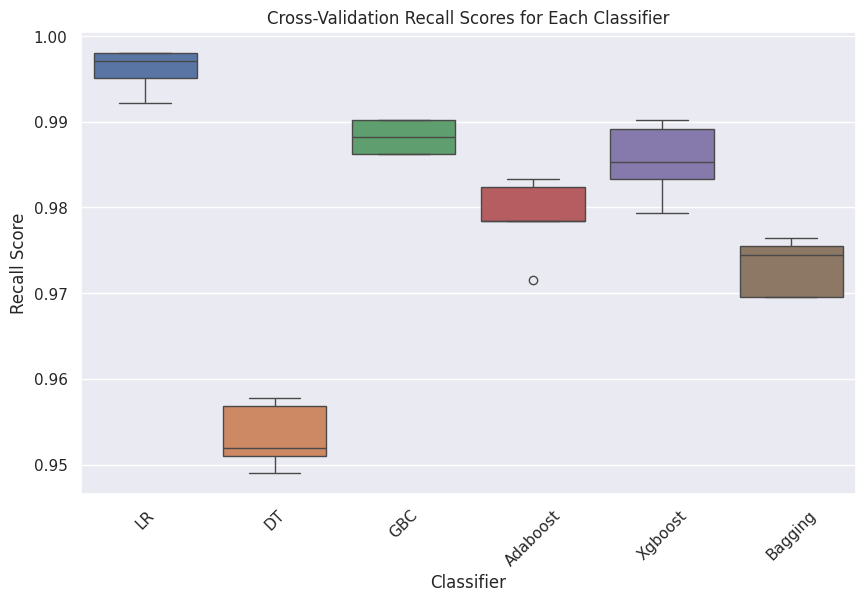

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plotting box plots
plt.figure(figsize=(10, 6))
sns.boxplot(data=cv_df)
plt.title('Cross-Validation Recall Scores for Each Classifier')
plt.xlabel('Classifier')
plt.ylabel('Recall Score')
plt.xticks(rotation=45)
plt.show()


On the basis of cross validation recall score, Logistic Regression is permormin better, followed by GBC and Xgboot.
We will tune - Adaboost, GradientBoost and XGBoost and see if the performance improves.

# **SMOTE:to handle the imbalance dataset**

SMOTE, which stands for Synthetic Minority Over-sampling Technique, is a popular method used in machine learning to address class imbalance in datasets. Class imbalance occurs when one class (the minority class) is significantly underrepresented compared to another class (the majority class). In such cases, standard machine learning algorithms may perform poorly because they tend to bias towards the majority class, ignoring the minority class

# **Oversampling the trained data using SMOTE technique**

Our dataset has a huge imbalance in target variable labels. To deal with such datasets, we have a few tricks up our sleeves, which we call Imbalanced Classification.

Imbalanced classification involves developing predictive models on classification datasets that have a severe class imbalance.

The challenge of working with imbalanced datasets is that most machine learning techniques will ignore, and in turn have poor performance on the minority class, although typically it is performance on the minority class that is most important, which is the case in our study here.

One approach to addressing imbalanced datasets is to oversample the minority class. The simplest approach involves duplicating examples in the minority class, although these examples don’t add any new information to the model. Instead, new examples can be synthesized from the existing examples. This is a type of data augmentation for the minority class and is referred to as the Synthetic Minority Oversampling Technique, or SMOTE for short.



In [ ]:
from imblearn.over_sampling import SMOTE

# Print class distribution before oversampling
print("Before UpSampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before UpSampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

# SMOTE (Synthetic Minority Over Sampling Technique)
sm = SMOTE(sampling_strategy="minority", k_neighbors=10, random_state=42)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

# Print class distribution after oversampling
print("After UpSampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After UpSampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))

# Print shape of the oversampled dataset
print("After UpSampling, the shape of train_X: {}".format(X_train_over.shape))
print("After UpSampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before UpSampling, counts of label 'Yes': 5099
Before UpSampling, counts of label 'No': 976 

After UpSampling, counts of label 'Yes': 5099
After UpSampling, counts of label 'No': 5099 

After UpSampling, the shape of train_X: (10198, 33)
After UpSampling, the shape of train_y: (10198,) 



# **Building the model with oversampled(SMOTE) data**
We are building all the seven models and train them with oversampled data.

In [ ]:
# Define classifiers
algorithms = [
    ("LR_Over", LogisticRegression(random_state=1, class_weight={0: 16, 1: 84}, solver='lbfgs', max_iter=1000)),
    ("DT_Over", DecisionTreeClassifier(random_state=1, class_weight={0: 16, 1: 84})),
    ("GBC_Over", GradientBoostingClassifier(random_state=1)),
    ("Adaboost_Over", AdaBoostClassifier(random_state=1)),
    ("Xgboost_Over", XGBClassifier(random_state=1, eval_metric="logloss")),
    ("Bagging_Over", BaggingClassifier(random_state=1))
]

# Initialize lists to store results
results = []
metrics = ['Accuracy', 'Recall', 'Precision', 'F1 Score']
evaluation_df = pd.DataFrame(columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                      'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                      'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

# Loop through classifiers
cv_dict={}
for name, model in algorithms:
    # Cross-validation
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)
    cv_result = cross_val_score(model, X_train_over, y_train_over, scoring='recall', cv=kfold)
    cv_dict[name]=cv_result# dict of model_name:cv_result
    cv_df=pd.DataFrame(cv_dict)
    mean_recall = cv_result.mean()

    # Fit model
    model.fit(X_train_over, y_train_over)

    # Predict
    y_train_pred = model.predict(X_train_over)
    y_test_pred = model.predict(X_test)

    # Calculate evaluation metrics
    train_accuracy = accuracy_score(y_train_over, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_recall = recall_score(y_train_over, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    train_precision = precision_score(y_train_over, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    train_f1 = f1_score(y_train_over, y_train_pred)
    test_f1 = f1_score(y_test, y_test_pred)
    train_roc_auc = roc_auc_score(y_train_over, y_train_pred)
    test_roc_auc = roc_auc_score(y_test, y_test_pred)

    # Store results
    results.append((name, mean_recall, train_accuracy, test_accuracy, train_recall, test_recall, train_precision,
                    test_precision, train_f1, test_f1, train_roc_auc, test_roc_auc))

# Create DataFrame from results
evaluation_df_over = pd.DataFrame(results, columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                               'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                               'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

import numpy as np

# Highlighting maximum value in green and minimum value in red
def highlight_max_min(s):
    is_max = s == s.max()
    is_min = s == s.min()
    styles = np.where(is_max, 'background-color: green', np.where(is_min, 'background-color: red', ''))
    return styles

# Apply conditional formatting without considering the index
evaluation_df_style_over = evaluation_df_over.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                          'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                          'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                          'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)

# Display styled DataFrame
evaluation_df_style_over

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
0,LR_Over,0.964505,0.791136,0.899309,0.965680,0.964139,0.715802,0.919798,0.822174,0.941447,0.791136,0.762069
1,DT_Over,0.937440,1.000000,0.933366,1.000000,0.953557,1.000000,0.966627,1.000000,0.960047,1.000000,0.890625
2,GBC_Over,0.969603,0.979408,0.964462,0.977643,0.977660,0.981106,0.979965,0.979371,0.978811,0.979408,0.936522
3,Adaboost_Over,0.949796,0.957835,0.942744,0.950775,0.958260,0.964392,0.973134,0.957535,0.965640,0.957835,0.909899
4,Xgboost_Over,0.979997,1.000000,0.967917,1.000000,0.982951,1.000000,0.978923,1.000000,0.980933,1.000000,0.936091
5,Bagging_Over,0.948423,0.997450,0.943731,0.995685,0.958260,0.999213,0.974298,0.997446,0.966212,0.997450,0.912976


## **Comparing the original and oversample models**

In [ ]:
# Concatenate the styled representations
df_compare = pd.concat([evaluation_df_style_over.data, evaluation_df_style.data], axis=0)

# Set a custom index
df_compare.index = ['Evaluation_df_Over'] * len(evaluation_df_style_over.data) + ['Evaluation_df'] * len(evaluation_df_style.data)

# Reset the index to make it unique
df_compare_reset_index = df_compare.reset_index(drop=True)

# Sort the DataFrame by index
df_compare_sorted = df_compare_reset_index.sort_index()

# Sort the DataFrame by 'Cross_Val_Score_Train' and 'Test_Recall'
df_compare_sorted = df_compare_sorted.sort_values(by=['Cross_Val_Score_Train', 'Test_Recall'], ascending=False)

# Apply conditional formatting
styled_df_compare = df_compare_sorted.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                              'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                              'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                              'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)
# Display the sorted DataFrame
styled_df_compare

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
6,LR,0.996078,0.887243,0.880553,0.996666,0.994709,0.883826,0.878961,0.936861,0.933260,0.656120,0.638893
8,GBC,0.988233,0.976626,0.963475,0.993920,0.990594,0.978567,0.966724,0.986184,0.978513,0.940095,0.906066
10,Xgboost,0.985488,1.000000,0.968411,1.000000,0.987654,1.000000,0.975044,1.000000,0.981308,1.000000,0.927673
4,Xgboost_Over,0.979997,1.000000,0.967917,1.000000,0.982951,1.000000,0.978923,1.000000,0.980933,1.000000,0.936091
9,Adaboost,0.978819,0.962963,0.955084,0.981369,0.982951,0.974679,0.964245,0.978012,0.973508,0.924086,0.896091
11,Bagging,0.973133,0.997366,0.956071,0.998235,0.978248,0.998627,0.969697,0.998431,0.973954,0.995531,0.909124
2,GBC_Over,0.969603,0.979408,0.964462,0.977643,0.977660,0.981106,0.979965,0.979371,0.978811,0.979408,0.936522
0,LR_Over,0.964505,0.791136,0.899309,0.965680,0.964139,0.715802,0.919798,0.822174,0.941447,0.791136,0.762069
7,DT,0.953325,1.000000,0.929418,1.000000,0.953557,1.000000,0.962040,1.000000,0.957780,1.000000,0.878317
3,Adaboost_Over,0.949796,0.957835,0.942744,0.950775,0.958260,0.964392,0.973134,0.957535,0.965640,0.957835,0.909899


## **Undersampling train data using Random Under Sampler(rus)**
Undersampling is another way of dealing to deal with imbalanced dataset.
Random undersampling involves randomly selecting examples from the majority class and deleting them from the training dataset until a balanced dataset is created.

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state=1)
X_train_Under, y_train_Under = rus.fit_resample(X_train, y_train)

In [ ]:
print("Before Under Sampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Under Sampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, counts of label 'Yes': {}".format(sum(y_train_Under == 1)))
print("After Under Sampling, counts of label 'No': {} \n".format(sum(y_train_Under == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_Under.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_Under.shape))

Before Under Sampling, counts of label 'Yes': 5099
Before Under Sampling, counts of label 'No': 976 

After Under Sampling, counts of label 'Yes': 976
After Under Sampling, counts of label 'No': 976 

After Under Sampling, the shape of train_X: (1952, 33)
After Under Sampling, the shape of train_y: (1952,) 



## **Build and train the Models with Undersampled Data**

In [ ]:
# Define classifiers
algorithms = [
    ("LR_Under", LogisticRegression(random_state=1, class_weight={0: 16, 1: 84}, solver='lbfgs', max_iter=1000)),
    ("DT_Under", DecisionTreeClassifier(random_state=1, class_weight={0: 16, 1: 84})),
    ("GBC_Under", GradientBoostingClassifier(random_state=1)),
    ("Adaboost_Under", AdaBoostClassifier(random_state=1)),
    ("Xgboost_Under", XGBClassifier(random_state=1, eval_metric="logloss")),
    ("Bagging_Under", BaggingClassifier(random_state=1))
]

# Initialize lists to store results
results = []
metrics = ['Accuracy', 'Recall', 'Precision', 'F1 Score']
evaluation_df = pd.DataFrame(columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                      'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                      'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

# Loop through classifiers
cv_dict={}
for name, model in algorithms:
    # Cross-validation
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)
    cv_result = cross_val_score(model, X_train_Under, y_train_Under, scoring='recall', cv=kfold)
    cv_dict[name]=cv_result# dict of model_name:cv_result
    cv_df=pd.DataFrame(cv_dict)
    mean_recall = cv_result.mean()

    # Fit model
    model.fit(X_train_Under, y_train_Under)

    # Predict
    y_train_pred = model.predict(X_train_Under)
    y_test_pred = model.predict(X_test)

    # Calculate evaluation metrics
    train_accuracy = accuracy_score(y_train_Under, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_recall = recall_score(y_train_Under, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    train_precision = precision_score(y_train_Under, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    train_f1 = f1_score(y_train_Under, y_train_pred)
    test_f1 = f1_score(y_test, y_test_pred)
    train_roc_auc = roc_auc_score(y_train_Under, y_train_pred)
    test_roc_auc = roc_auc_score(y_test, y_test_pred)

    # Store results
    results.append((name, mean_recall, train_accuracy, test_accuracy, train_recall, test_recall, train_precision,
                    test_precision, train_f1, test_f1, train_roc_auc, test_roc_auc))

# Create DataFrame from results
evaluation_df_Under = pd.DataFrame(results, columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                               'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                               'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

import numpy as np

# Highlighting maximum value in green and minimum value in red
def highlight_max_min(s):
    is_max = s == s.max()
    is_min = s == s.min()
    styles = np.where(is_max, 'background-color: green', np.where(is_min, 'background-color: red', ''))
    return styles

# Apply conditional formatting without considering the index
evaluation_df_style_Under = evaluation_df_Under.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                          'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                          'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                          'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)

# Display styled DataFrame
evaluation_df_style_Under

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
0,LR_Under,0.949812,0.766393,0.894867,0.964139,0.965315,0.690896,0.914254,0.804962,0.939091,0.766393,0.745734
1,DT_Under,0.885201,1.000000,0.880059,1.000000,0.878895,1.000000,0.975849,1.000000,0.924838,1.000000,0.882524
2,GBC_Under,0.932376,0.976947,0.938302,0.969262,0.940035,0.984391,0.985820,0.976768,0.962383,0.976947,0.934633
3,Adaboost_Under,0.923161,0.950307,0.922014,0.941598,0.925338,0.958290,0.980685,0.949871,0.952208,0.950307,0.914977
4,Xgboost_Under,0.934401,1.000000,0.945706,1.000000,0.947090,1.000000,0.987738,1.000000,0.966987,1.000000,0.942776
5,Bagging_Under,0.892391,0.989754,0.908193,0.981557,0.902410,0.997917,0.987138,0.989669,0.942875,0.989754,0.920436


On the basis of cross validation score and test recall LR_under is the best model followed by Xgboost and GBC_Under.

# **Comparing model performance with original, oversampled and undersampled datasets**

In [ ]:
# Concatenate the styled representations
df_compare = pd.concat([evaluation_df_style_over.data, evaluation_df_style_Under.data, evaluation_df_style.data], axis=0)

# Set a custom index
df_compare.index = ['Evaluation_df_Over'] * len(evaluation_df_style_over.data)+['Evaluation_df_Under'] * len(evaluation_df_style_Under.data)  + ['Evaluation_df'] * len(evaluation_df_style.data)

# Reset the index to make it unique
df_compare_reset_index = df_compare.reset_index(drop=True)

# Sort the DataFrame by index
df_compare_sorted = df_compare_reset_index.sort_index()

# Sort the DataFrame by 'Cross_Val_Score_Train' and 'Test_Recall'
df_compare_sorted = df_compare_sorted.sort_values(by=['Test_Recall','Cross_Val_Score_Train'], ascending=False)

# Apply conditional formatting
styled_df_compare = df_compare_sorted.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                              'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                              'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                              'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)
# Display the sorted DataFrame
styled_df_compare

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
12,LR,0.996078,0.887243,0.880553,0.996666,0.994709,0.883826,0.878961,0.936861,0.933260,0.656120,0.638893
14,GBC,0.988233,0.976626,0.963475,0.993920,0.990594,0.978567,0.966724,0.986184,0.978513,0.940095,0.906066
16,Xgboost,0.985488,1.000000,0.968411,1.000000,0.987654,1.000000,0.975044,1.000000,0.981308,1.000000,0.927673
4,Xgboost_Over,0.979997,1.000000,0.967917,1.000000,0.982951,1.000000,0.978923,1.000000,0.980933,1.000000,0.936091
15,Adaboost,0.978819,0.962963,0.955084,0.981369,0.982951,0.974679,0.964245,0.978012,0.973508,0.924086,0.896091
17,Bagging,0.973133,0.997366,0.956071,0.998235,0.978248,0.998627,0.969697,0.998431,0.973954,0.995531,0.909124
2,GBC_Over,0.969603,0.979408,0.964462,0.977643,0.977660,0.981106,0.979965,0.979371,0.978811,0.979408,0.936522
6,LR_Under,0.949812,0.766393,0.894867,0.964139,0.965315,0.690896,0.914254,0.804962,0.939091,0.766393,0.745734
0,LR_Over,0.964505,0.791136,0.899309,0.965680,0.964139,0.715802,0.919798,0.822174,0.941447,0.791136,0.762069
3,Adaboost_Over,0.949796,0.957835,0.942744,0.950775,0.958260,0.964392,0.973134,0.957535,0.965640,0.957835,0.909899


On the basis of cross value score and test recall, Logistic Regression with original dataset is the best model, followed by GBC, Xgboot and Xgboost_over.We will now try to tune these 4 models for improved parameter and to handle overftting or underfatting.

a)LR: it is slightly underfitting as Cross_Val_Score_Train > test_recall.

b)GBC: it is slightly overfitting as Cross_Val_Score_Train < test_recall.

c)Xgboost: it is slightly overfitting as Cross_Val_Score_Train < test_recall.

d)Xgboost_over:it is slightly overfitting as Cross_Val_Score_Train < test_recall.

# **Hyperparameter Tuning:**

The process of searching the optimal values of hyperparameters for any machine learning algorithm is called hyperparameter tuning/optimization.

The goal of Hyperparameter Tuning is to achieve a minimum error from the outcome of any ML models.

The Hyperparameter Tuning influences the convergence of any ML Algorithm to a large extent.

There are different types of Hyperparameter Tuning Methods:

1. GridSearch

2. RandomSearch

3. Successive Halving

4. Bayesian Optimizers

5. Manual Search

Here, I will conduct the GridSearch and the RandomSearch cross-validation techiques to tune the parameters of the ML models.

# **Tuning the LR model with original dataset**
Here, we find the best parameter for high recall using Random Search with cross validation

**Model Tuning using RandomizedSearchCV:**

Typically a hyperparameter has a known effect on a model in the general sense, but it is not clear how to best set a hyperparameter for a given dataset. Further, many machine learning models have a range of hyperparameters and they may interact in nonlinear ways.

As such, it is often required to search for a set of hyperparameters that result in the best performance of a model on a dataset. This is called hyperparameter optimization, hyperparameter tuning, or hyperparameter search.

An optimization procedure involves defining a search space. This can be thought of geometrically as an n-dimensional volume, where each hyperparameter represents a different dimension and the scale of the dimension are the values that the hyperparameter may take on, such as real-valued, integer-valued, or categorical.

Search Space: Volume to be searched where each dimension represents a hyperparameter and each point represents one model configuration. A point in the search space is a vector with a specific value for each hyperparameter value. The goal of the optimization procedure is to find a vector that results in the best performance of the model after learning, such as maximum accuracy or minimum error.

A range of different optimization algorithms may be used, although two of the simplest and most common methods are random search and grid search.

Random Search: Define a search space as a bounded domain of hyperparameter values and randomly sample points in that domain.  

Grid Search: Define a search space as a grid of hyperparameter values and evaluate every position in the grid.

**Getting the best parameters for tuning the model**

In [ ]:
%%time

#To supress warnings
import warnings
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

# defining model
model = LogisticRegression(random_state=1, class_weight={0: 16, 1: 84}, solver='lbfgs', max_iter=1000)

# Parameter grid to pass in RandomizedSearchCV
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Regularization parameter
    'class_weight': [{0: 16, 1: 84}, {0: 1, 1: 1}, {0: 1, 1: 5}],  # Class weight
    'solver': ['lbfgs', 'liblinear']  # Solver algorithm
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
LR_tuned = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=36, scoring=scorer, cv=10, random_state=42, n_jobs=-1)

# estimator: This parameter specifies the machine learning estimator or model that you want to tune. In your case, it's a LogisticRegression model.

# param_distributions: This parameter is a dictionary where keys are the hyperparameters of the estimator, and values are distributions or lists of possible values for each hyperparameter. It defines the search space for hyperparameters.

# n_iter: This parameter specifies the number of parameter settings that are sampled from the search space defined by param_distributions. It determines how many combinations of hyperparameters will be tried during the search.

# scoring: This parameter defines the evaluation metric used to compare different parameter settings. It can be a single string (representing a predefined scorer) or a callable object or function that returns a scalar score.

# cv: This parameter determines the cross-validation splitting strategy. It can be an integer specifying the number of folds in a KFold cross-validation, a cross-validation splitter, or an iterable yielding (train, test) splits.

# random_state: This parameter is used to control the randomization of the search process. It ensures reproducibility of results by fixing the random seed for random number generation.

# n_jobs: This parameter specifies the number of parallel jobs to run during the search. Setting it to -1 allows the algorithm to use all available CPU cores for parallel processing.

# Fitting parameters in RandomizedSearchCV
LR_tuned.fit(X_train, y_train)

print("Best parameters are {} with CV score={}".format(LR_tuned.best_params_, LR_tuned.best_score_))


Best parameters are {'solver': 'lbfgs', 'class_weight': {0: 1, 1: 5}, 'C': 0.001} with CV score=1.0
CPU times: user 540 ms, sys: 134 ms, total: 674 ms
Wall time: 12.5 s


**Building LR model with tuned/best parameter:**

In [ ]:
# Importing necessary libraries
from sklearn.linear_model import LogisticRegression

# Defining the best parameters obtained from hyperparameter tuning
best_params = {
    'solver': 'lbfgs',
    'class_weight': {0: 1, 1: 5},
    'C': 0.001
}
#Smaller values of C specify stronger regularization. It is a technique used to prevent overfitting by adding a penalty term to the loss function.

# Building Logistic Regression model with best parameters
lr_tuned_model = LogisticRegression(**best_params, max_iter=1000, random_state=1)

# Fitting the model on training data
lr_tuned_model.fit(X_train, y_train)



LogisticRegression(C=0.001, class_weight={0: 1, 1: 5}, max_iter=1000,
                   random_state=1)

**Getting the cv score**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import recall_score

# Create and train the Logistic Regression model
lr_tuned_model = LogisticRegression(C=0.001, class_weight={0: 16, 1: 84}, max_iter=1000, random_state=1, solver='liblinear')
lr_tuned_model.fit(X_train, y_train)

# Get evaluation metrics scores
recall_lr_train = recall_score(y_train, lr_tuned_model.predict(X_train))
recall_lr_val = recall_score(y_val, lr_tuned_model.predict(X_val))

# Perform cross-validation with StratifiedKFold
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
scoring = "recall"
lr_cv = cross_val_score(estimator=lr_tuned_model, X=X_train, y=y_train, scoring=scoring, cv=kfold)

# Print evaluation metrics scores
print("Logistic Regression Tuned with Down Sampling Metrics:")
print(f"Train Recall: {recall_lr_train:.4f}")
print(f"Validation Recall: {recall_lr_val:.4f}")
print(f"Cross-Validation Mean Recall: {lr_cv.mean():.4f}")

Logistic Regression Tuned with Down Sampling Metrics:
Train Recall: 0.9982
Validation Recall: 0.9994
Cross-Validation Mean Recall: 0.9978


In [ ]:
#define confusion matrix that draws the heatmap
def make_confusion_matrix(model, test_X, y_actual, labels=[1, 0]):
    """
    model : classifier to predict values of X
    test_X: test set
    y_actual : ground truth

    """
    y_predict = model.predict(test_X)
    cm = metrics.confusion_matrix(y_actual, y_predict, labels=[1, 0])
    df_cm = pd.DataFrame(
        cm,
        index=[i for i in ["Actual - Attrited", "Actual - Existing"]],
        columns=[i for i in ["Predicted - Attrited", "Predicted - Existing"]],
    )
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten() / np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in zip(group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)
    plt.figure(figsize=(5, 3))
    sns.heatmap(df_cm, annot=labels, fmt="", cmap="Blues").set(title="Confusion Matrix")

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn import metrics

def make_confusion_matrix(model, test_X, y_actual, labels=[1, 0]):
    """
    model : classifier to predict values of X
    test_X: test set
    y_actual : ground truth
    """
    # Predict labels using the model
    y_predict = model.predict(test_X)

    # Compute confusion matrix
    cm = metrics.confusion_matrix(y_actual, y_predict, labels=labels)

    # Compute TP, TN, FP, FN
    TP = cm[0, 0]
    FN = cm[0, 1]
    FP = cm[1, 0]
    TN = cm[1, 1]

    # Format labels for heatmap annotations
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten() / np.sum(cm)]
    labels = [f"TP: {TP}\n{group_percentages[0]}", f"FN: {FN}\n{group_percentages[1]}", f"FP: {FP}\n{group_percentages[2]}", f"TN: {TN}\n{group_percentages[3]}"]
    labels = np.asarray(labels).reshape(2, 2)

    # Create heatmap
    plt.figure(figsize=(5, 3))
    sns.heatmap(cm, annot=labels, fmt="", cmap="Blues", xticklabels=["Predicted - Attrited", "Predicted - Existing"], yticklabels=["Actual - Attrited", "Actual - Existing"]).set(title="Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.show()

**Confusion matrix on validation dataset:**

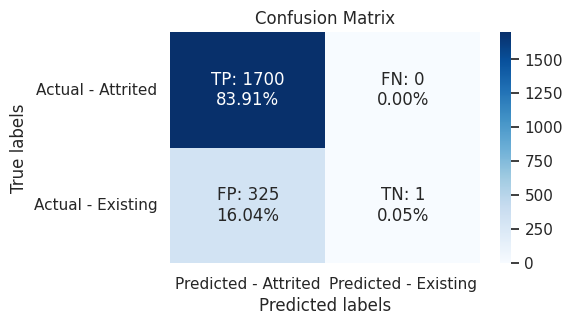

In [ ]:
make_confusion_matrix(lr_tuned_model, X_val, y_val)

## **Tuning the GBC(2nd best) model with original dataset:**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import metrics
import numpy as np

# Define the model
gbc_model = GradientBoostingClassifier(random_state=1)

# Define the parameter grid
param_grid_gbc = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.5, 0.7, 1.0],
}

# Define the scoring metric
scorer = metrics.make_scorer(metrics.recall_score)

# Define RandomizedSearchCV with reduced iterations and CV folds
gbc_tuned = RandomizedSearchCV(
    estimator=gbc_model,
    param_distributions=param_grid_gbc,
    n_iter=10,
    scoring=scorer,
    cv=5,
    random_state=42,
    n_jobs=-1
)

# Fit the RandomizedSearchCV
gbc_tuned.fit(X_train, y_train)

print("Best parameters are {} with CV score={}".format(gbc_tuned.best_params_, gbc_tuned.best_score_))


Best parameters are {'subsample': 0.5, 'n_estimators': 50, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 3, 'learning_rate': 0.01} with CV score=1.0


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score

# Define the best parameters obtained from hyperparameter tuning
best_params_gbc = {
    'subsample': 0.5,
    'n_estimators': 50,
    'min_samples_split': 10,
    'min_samples_leaf': 4,
    'max_depth': 3,
    'learning_rate': 0.01
}

# Build Gradient Boosting Classifier model with best parameters
gbc_tuned_model = GradientBoostingClassifier(**best_params_gbc, random_state=1)

# Perform cross-validation
cv_scores = cross_val_score(gbc_tuned_model, X_train, y_train, cv=5)

# Fit the model on the entire training data
gbc_tuned_model.fit(X_train, y_train)



GradientBoostingClassifier(learning_rate=0.01, min_samples_leaf=4,
                           min_samples_split=10, n_estimators=50,
                           random_state=1, subsample=0.5)

# **Getting cv score:**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import recall_score

# Create and train the Gradient Boosting Classifier model
gbc_tuned_model = GradientBoostingClassifier(learning_rate=0.01, min_samples_leaf=4,
                                             min_samples_split=10, n_estimators=50,
                                             random_state=1, subsample=0.5)
gbc_tuned_model.fit(X_train, y_train)

# Get evaluation metrics scores
recall_gbc_train = recall_score(y_train, gbc_tuned_model.predict(X_train))
recall_gbc_val = recall_score(y_val, gbc_tuned_model.predict(X_val))

# Perform cross-validation with StratifiedKFold
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
gbc_cv = cross_val_score(estimator=gbc_tuned_model, X=X_train, y=y_train, scoring="recall", cv=kfold)

# Print evaluation metrics scores
print("Gradient Boosting Classifier Tuned with original dataset:")
print(f"Train Recall: {recall_gbc_train:.4f}")
print(f"Validation Recall: {recall_gbc_val:.4f}")
print(f"Cross-Validation Mean Recall: {gbc_cv.mean():.4f}")


Gradient Boosting Classifier Tuned with original dataset:
Train Recall: 1.0000
Validation Recall: 1.0000
Cross-Validation Mean Recall: 1.0000


**Confusion matrix on validation data:**

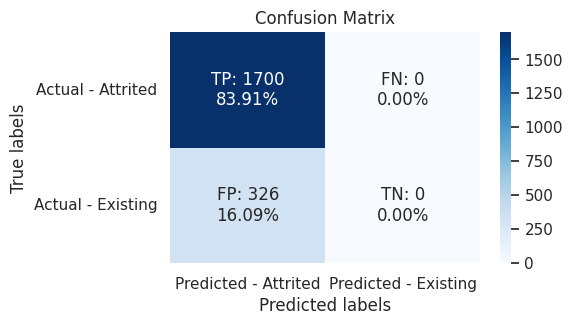

In [ ]:
make_confusion_matrix(gbc_tuned_model, X_val, y_val)

## **Tuning the Xgboost(3rd best) model with original dataset:**

# Getting the best parameters for tuning the Xgboost model:

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier
from sklearn import metrics
import numpy as np

# Define the model
xgb_model = XGBClassifier(random_state=1)

# Define the parameter grid with reduced search space
param_grid_xgb = {
    'n_estimators': np.arange(50, 201, 50),
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
}

# Define the scoring metric
scorer = metrics.make_scorer(metrics.recall_score)

# Define RandomizedSearchCV with reduced iterations and CV folds
xgb_tuned = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_grid_xgb,
    n_iter=10,  # Reduced number of iterations
    scoring=scorer,
    cv=5,
    random_state=42,
    n_jobs=-1
)

# Fit the RandomizedSearchCV
xgb_tuned.fit(X_train, y_train)

print("Best parameters are {} with CV score={}".format(xgb_tuned.best_params_, xgb_tuned.best_score_))


Best parameters are {'n_estimators': 50, 'max_depth': 5, 'learning_rate': 0.01} with CV score=1.0


# **Building the model with best/tuned parameter**

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score

# Define the best parameters obtained from hyperparameter tuning
best_params_xgb = {
    'subsample': 0.5,
    'n_estimators': 50,
    'max_depth': 3,
    'learning_rate': 0.01
}

# Build XGBoost Classifier model with best parameters
xgb_tuned_model = XGBClassifier(**best_params_xgb, random_state=1)

# Perform cross-validation
cv_scores = cross_val_score(xgb_tuned_model, X_train, y_train, cv=5)

# Fit the model on the entire training data
xgb_tuned_model.fit(X_train, y_train)



XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=50, n_jobs=None,
              num_parallel_tree=None, random_state=1, ...)

# **Getting cv score:**

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import recall_score

# Create and train the XGBoost Classifier model
xgb_tuned_model = XGBClassifier(learning_rate=0.01, n_estimators=50,
                                 max_depth=3, subsample=0.5, random_state=1)
xgb_tuned_model.fit(X_train, y_train)

# Get evaluation metrics scores
recall_xgb_train = recall_score(y_train, xgb_tuned_model.predict(X_train))
recall_xgb_val = recall_score(y_val, xgb_tuned_model.predict(X_val))

# Perform cross-validation with StratifiedKFold
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
xgb_cv = cross_val_score(estimator=xgb_tuned_model, X=X_train, y=y_train, scoring="recall", cv=kfold)

# Print evaluation metrics scores
print("XGBoost Classifier Tuned with original dataset:")
print(f"Train Recall: {recall_xgb_train:.4f}")
print(f"Validation Recall: {recall_xgb_val:.4f}")
print(f"Cross-Validation Mean Recall: {xgb_cv.mean():.4f}")


XGBoost Classifier Tuned with original dataset:
Train Recall: 1.0000
Validation Recall: 1.0000
Cross-Validation Mean Recall: 1.0000


# **Confusion matrix:**

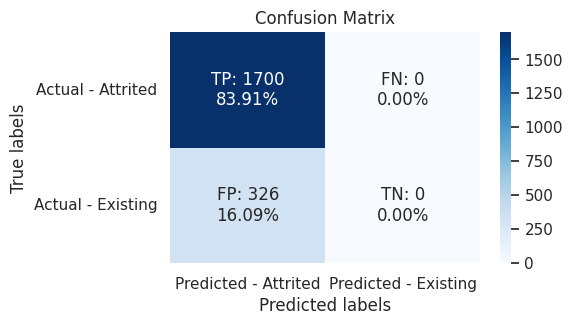

In [ ]:
make_confusion_matrix(xgb_tuned_model, X_val, y_val)

## **Tuning the Xgboost_over(4th best) model with oversampled dataset:**

**Getting the best parameters for tuning the Xgboost_over model:**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier
from sklearn import metrics
import numpy as np

# Define the model
xgb_over_model = XGBClassifier(random_state=1)

# Define the parameter grid with reduced search space
param_grid_xgb_over = {
    'n_estimators': np.arange(50, 201, 50),
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
}

# Define the scoring metric
scorer = metrics.make_scorer(metrics.recall_score)

# Define RandomizedSearchCV with reduced iterations and CV folds
xgb_tuned_over = RandomizedSearchCV(
    estimator=xgb_over_model,
    param_distributions=param_grid_xgb_over,
    n_iter=10,  # Reduced number of iterations
    scoring=scorer,
    cv=5,
    random_state=42,
    n_jobs=-1
)

# Fit the RandomizedSearchCV
xgb_tuned_over.fit(X_train_over, y_train_over)

print("Best parameters are {} with CV score={}".format(xgb_tuned_over.best_params_, xgb_tuned_over.best_score_))


Best parameters are {'n_estimators': 150, 'max_depth': 4, 'learning_rate': 0.2} with CV score=0.986271431045431


## **Building the Xgboost_over model with best/tuned parameter**

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score

# Define the best parameters obtained from hyperparameter tuning
best_params_xgb_over = {
    'n_estimators': 150,
    'max_depth': 4,
    'learning_rate': 0.2
}

# Build XGBoost Classifier model with best parameters
xgb_over_tuned_model = XGBClassifier(**best_params_xgb, random_state=1)

# Perform cross-validation
cv_scores = cross_val_score(xgb_over_tuned_model, X_train, y_train, cv=5)

# Fit the model on the entire training data
xgb_over_tuned_model.fit(X_train_over, y_train_over)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=50, n_jobs=None,
              num_parallel_tree=None, random_state=1, ...)

# **Getting the cv score:**

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import recall_score

# Create and train the XGBoost Classifier model
xgb_over_tuned_model = XGBClassifier(learning_rate=0.01, n_estimators=50,
                                     max_depth=3, subsample=0.5, random_state=1)
xgb_over_tuned_model.fit(X_train_over, y_train_over)

# Get evaluation metrics scores
recall_xgb_over_train = recall_score(y_train_over, xgb_over_tuned_model.predict(X_train_over))
recall_xgb_over_val = recall_score(y_val, xgb_over_tuned_model.predict(X_val))

# Perform cross-validation with StratifiedKFold
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
xgb_over_cv = cross_val_score(estimator=xgb_over_tuned_model, X=X_train_over, y=y_train_over, scoring="recall", cv=kfold)

# Print evaluation metrics scores
print("XGBoost Classifier Tuned with oversampled dataset:")
print(f"Train Recall: {recall_xgb_over_train:.4f}")
print(f"Validation Recall: {recall_xgb_over_val:.4f}")
print(f"Cross-Validation Mean Recall: {xgb_over_cv.mean():.4f}")


XGBoost Classifier Tuned with oversampled dataset:
Train Recall: 0.9133
Validation Recall: 0.9135
Cross-Validation Mean Recall: 0.9063


# **Confusion matrix:**

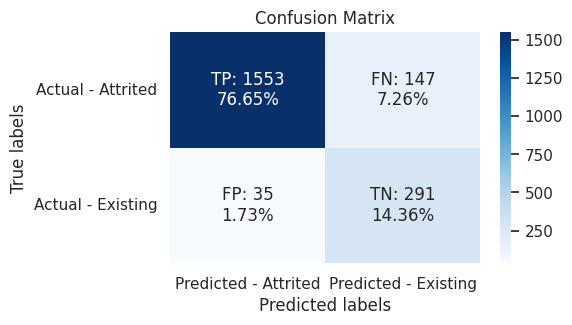

In [ ]:
make_confusion_matrix(xgb_over_tuned_model, X_val, y_val)



### **Comparing the hypertuned models:**



In [ ]:
lr_cv = evaluation_df.Cross_Val_Score_Train[0] # derived from the original LR model
gbc_cv = evaluation_df.Cross_Val_Score_Train[2] # derived from the original GBC model
xgb_cv = evaluation_df.Cross_Val_Score_Train[4] # derived from the original Xgboost model
xgb_cv_over = evaluation_df_over.Cross_Val_Score_Train[4] #derived from the oversampled LR model

In [ ]:
lr_recall = evaluation_df.Test_Recall[0] # derived from the original LR model
gbc_recall = evaluation_df.Test_Recall[2] # derived from the original GBC model
xgb_recall = evaluation_df.Test_Recall[4] # derived from the original Xgboost model
xgb_recall_over = evaluation_df_over.Test_Recall[4] #derived from the oversampled LR model

In [ ]:
# Define the model names
model_names = ["LR", "GBC", "XGB", "XGB_Over"]

# Define the evaluation metrics scores for each model
cross_val_train = [lr_cv, gbc_cv, xgb_cv, xgb_cv_over]

recall_test = [lr_recall, gbc_recall, xgb_recall, xgb_recall_over]
xgb_recall_over
# Create the comparison dataframe
comparison_df = pd.DataFrame(
    {
        "Model": model_names,
        "Cross_Val_Score_Train": cross_val_train,
        "Test_Recall": recall_test
    }
)
comparison_df
comparison_df_sorted = comparison_df.sort_values(by = ['Test_Recall','Cross_Val_Score_Train'], ascending = False)
comparison_df_sorted

,Model,Cross_Val_Score_Train,Test_Recall
0,LR,0.996078,0.994709
1,GBC,0.988233,0.990594
2,XGB,0.985488,0.987654
3,XGB_Over,0.979997,0.982951


In [ ]:
best_df1=evaluation_df.iloc[[0, 2, 4]]
best_df2=evaluation_df_over.iloc[[4]]
combined_best_df=pd.concat([best_df1, best_df2], axis=0)
combined_best_df.sort_values(by=['Test_Recall','Cross_Val_Score_Train'],ascending=False)
combined_best_df.reset_index(drop=True, inplace=True)
combined_best_df

# Apply conditional formatting
styled_df_compare = combined_best_df.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                              'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                              'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                              'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)
# Display the sorted DataFrame
styled_df_compare

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
0,LR,0.996078,0.887243,0.880553,0.996666,0.994709,0.883826,0.878961,0.936861,0.933260,0.656120,0.638893
1,GBC,0.988233,0.976626,0.963475,0.993920,0.990594,0.978567,0.966724,0.986184,0.978513,0.940095,0.906066
2,Xgboost,0.985488,1.000000,0.968411,1.000000,0.987654,1.000000,0.975044,1.000000,0.981308,1.000000,0.927673
3,Xgboost_Over,0.979997,1.000000,0.967917,1.000000,0.982951,1.000000,0.978923,1.000000,0.980933,1.000000,0.936091


# **Choosing the best model:**
Depending on the specific requirements of our problem (e.g., emphasis on avoiding false negatives, minimizing false positives, overall model performance), I am choosing to move forward with XGBoost Classifier as the best model.

# **Checking Test Data on Xgboost model with original dataset:**

# **Visualizing important features by Feature Importance:**

Feature importance is a technique used to determine the relative significance of different features in a machine learning model. It helps in understanding which features have the most influence on the model's predictions. There are various methods to calculate feature importance, and the choice of method depends on the type of model being used. Here, we are using Decision Tree-based Feature Importance method:feature_importances_

In [163]:
xgb_model=XGBClassifier(random_state=1, eval_metric="logloss")
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

IndexError: index 37 is out of bounds for axis 0 with size 20

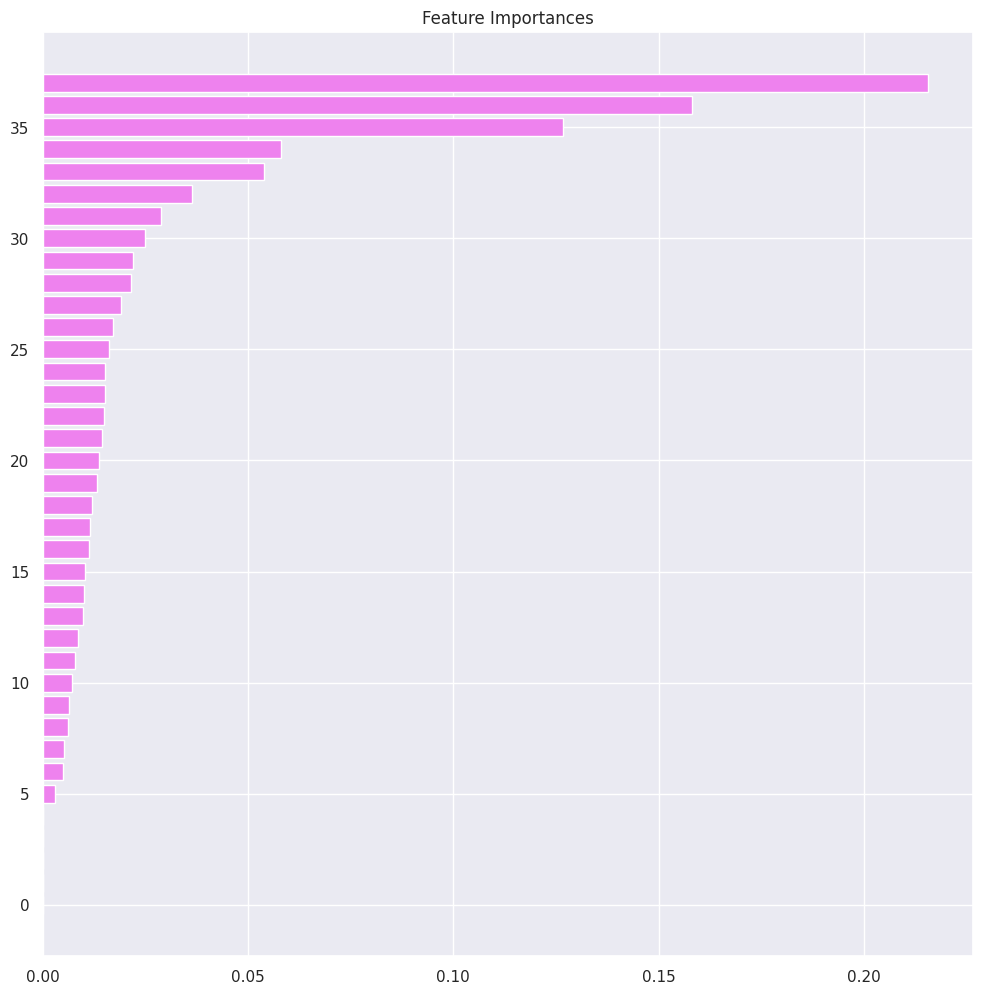

In [164]:
import matplotlib.pyplot as plt

# Get feature importances from the trained XGBoost model
importances = xgb_model.feature_importances_

# Get feature names (assuming X_train.columns contains feature names)
feature_names = X_train1.columns

# Sort indices based on importances
indices = importances.argsort()

# Create a horizontal bar plot to visualize feature importances
plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

In [162]:
# Check lengths
print("Length of importances:", len(importances))
print("Length of feature_names:", len(feature_names))

# Inspect indices
print("Indices array:", indices)


Length of importances: 38
Length of feature_names: 20
Indices array: [37 35 24 36 16 20 19 32 34  2 26 18 17 29 31 22 28 23 33  3 14 15  9  0
 21  7 25 30 27  6 10  1  5 13 11  4  8 12]
